### CIS4118 - Practical Coursework 2

##### Author: Chioma Onwudiwe

##### Student number/email: 25401017/25401017@edgehill.ac.uk

##### submission deadline: may 5, 2023

##### Institution: Edge Hill University

In [1]:
#pip freeze | grep tensorflow
#!pip install tensorflow
#!pip install --upgrade scikit-learn
#!pip install umap-learn

### Loading relevant libraries

In [41]:
#importing python libraries 
import numpy as np
import pandas as pd
from IPython.display import display
import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.colors as mlt
import tensorflow as tf
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from umap import UMAP
import colorblind
import warnings 
warnings.filterwarnings("ignore")

### Loading the features and activity files

In [3]:
#loading the activity labels
activity_data = pd.read_csv('/Users/25401017/HAPT_Data_Set/activity_labels.txt', 
                            sep = '\s+', names=['activity_ID', 'activity_name'], header=None)
activity_data.shape

(12, 2)

In [4]:
#loading the features data
feature_data = pd.read_csv('/Users/25401017/HAPT_Data_Set/features.txt',sep = '\s+', names=['features'], header=None)
#transforming feature data to list
feature_values = feature_data['features'].tolist()
feature_data.shape

(561, 1)

### Loading and merging contents of the training folder

In [5]:
#uploading the training data, training labels and their subject ids
subject_ID = pd.read_csv('/Users/25401017/HAPT_Data_Set/Train/subject_id_train.txt', 
                         sep = '\s+', names=['subject_ID'], header=None)
training_data = pd.read_csv('/Users/25401017/HAPT_Data_Set/Train/X_train.txt', sep = "\s+", header=None)
training_labels = pd.read_csv('/Users/25401017/HAPT_Data_Set/Train/y_train.txt', sep = '\s+ ', names=['label'], header=None)

In [6]:
#mapping the training labels to their various activities
label_mapping = training_labels['label'].map({1 : 'WALKING', 2 : 'WALKING_UPSTAIRS', 3 :'WALKING_DOWNSTAIRS', 4 : 'SITTING', 
                 5 : 'STANDING', 6 : 'LAYING', 7 : 'STAND_TO_SIT', 8 : 'SIT_TO_STAND',
                 9 : 'SIT_TO_LIE', 10 : 'LIE_TO_SIT', 11 : 'STAND_TO_LIE', 12 : 'LIE_TO_STAND'})

#creating new column in the training label dataframe for mapped activities
training_labels['activity'] = label_mapping

In [7]:
#assigning column names to training data columns
training_data.columns = feature_values

In [8]:
#merging training data, training label and subject id into one dataframe horizontally
df_training = pd.concat([subject_ID, training_data, training_labels], axis=1)
#printing dataframe
df_training.shape

(7767, 564)

### Loading and merging contents of test folder

In [9]:
#loading the testing data, testing labels and testing subject_id
test_subject_ID = pd.read_csv('/Users/25401017/HAPT_Data_Set/Test/subject_id_test.txt', sep = '\s+', names=['subject_ID'], header=None)
testing_data = pd.read_csv('/Users/25401017/HAPT_Data_Set/Test/X_test.txt', sep = '\s+', header=None)
testing_labels = pd.read_csv('/Users/25401017/HAPT_Data_Set/Test/y_test.txt', sep = '\s+', names=['label'], header=None)
#feature_data = pd.read_csv('/Users/25401017/HAPT_Data_Set/features.txt', sep = '\n ', header=None)

In [10]:
#mapping the testing labels to their various activities
label_mapping = testing_labels['label'].map({1 : 'WALKING', 2 : 'WALKING_UPSTAIRS', 3 :'WALKING_DOWNSTAIRS', 4 : 'SITTING', 
                 5 : 'STANDING', 6 : 'LAYING', 7 : 'STAND_TO_SIT', 8 : 'SIT_TO_STAND',
                 9 : 'SIT_TO_LIE', 10 : 'LIE_TO_SIT', 11 : 'STAND_TO_LIE', 12 : 'LIE_TO_STAND'})

#creating new column for test label mapping
testing_labels['activity'] = label_mapping
#dropping the label column in the testing_label dataframe
#testing_labels = testing_labels.drop('label', axis=1)

In [11]:
#assigning column names to testing_data columns
testing_data.columns = feature_values

In [12]:
#merging the test_subject_ID, testing_data, testing_labels on the horizontal axis
df_testing = pd.concat([test_subject_ID, testing_data, testing_labels], axis=1)

#viewing dataframe
df_testing.shape

(3162, 564)

### Merging the merged training and testing dataframes 

In [13]:
#merging both the test and training data vertically
merged_dataset = pd.concat([df_training, df_testing], axis=0)
#resetting the index of merged dataset
merged_dataset = merged_dataset.reset_index(drop=True)
#viewing dataframe
merged_dataset.shape

(10929, 564)

### Data cleaning activities

In [14]:
#checking for empty values in merged dataset columns
merged_dataset.isnull().sum()

subject_ID                     0
tBodyAcc-Mean-1                0
tBodyAcc-Mean-2                0
tBodyAcc-Mean-3                0
tBodyAcc-STD-1                 0
                              ..
tXAxisAcc-AngleWRTGravity-1    0
tYAxisAcc-AngleWRTGravity-1    0
tZAxisAcc-AngleWRTGravity-1    0
label                          0
activity                       0
Length: 564, dtype: int64

In [15]:
#checking for duplicate values
merged_dataset.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
10924    False
10925    False
10926    False
10927    False
10928    False
Length: 10929, dtype: bool

### Saving and loading cleaned merged dataset

In [16]:
#saving the merged dataset into a directory

merged_dataset.to_csv('/Users/25401017/HAPT_Data_Set/merged_dataset.csv', index=False)
#print statement
print('saved successfully')

saved successfully


In [17]:
#importing file

merged_data = pd.read_csv('/Users/25401017/HAPT_Data_Set/merged_dataset.csv')
#print statement
print('loaded successfully')
#shape of the dataset
merged_data.shape

loaded successfully


(10929, 564)

### Visualising the number of activities per volunteer using a bar chart. sns.countplot() is a function in the Seaborn library in Python that is used to plot a bar chart of the counts of categorical variables. It takes in a categorical variable and plots the frequency count of each category in the form of bars. Bar chart is used here because it allow us to easily compare the frequencies of different activities performed, and they provide a visual representation of how much more or less frequent one activity is than another. from the chart we can see that the stationary activities are more frequent in the dataset. however, because there is so much data here, an interactive bar chart was plotted below to make it more interpretable.

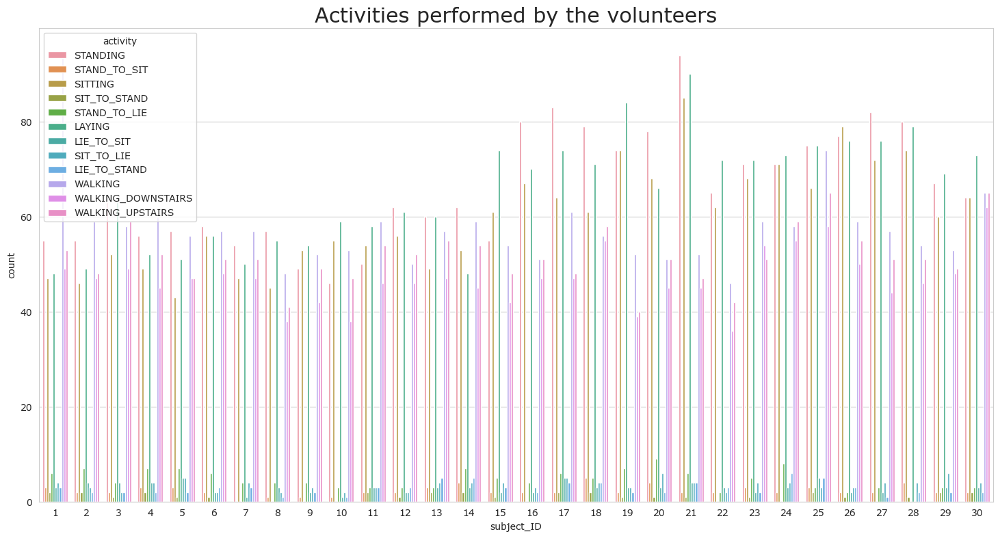

In [18]:
#plotting the frequency in activities of each volunteer

plt.figure(figsize=(18, 9))
sns.set_style("whitegrid")
plt.rcParams["font.family"] = "Verdana"
plt.title("Activities performed by the volunteers", fontsize=22)
sns.countplot(x="subject_ID", hue="activity", data=merged_data)
plt.show()

### For more interactivity and ease of interpretation, go.bar() from the plotly library is used. unlike the seaborn plot, we can hover to see the actual count of each activity performed within the data. From the chart, we can see that the most performed activity is standing and the least performed is sit-to-stand

In [19]:
#plotting activity distribution within the dataset

#assigning each unique value of the activity column to the variable 'activity_count'
activity_count = merged_data['activity'].value_counts()

#assigning the value at index 0 of activity_count to x
x = activity_count.shape[0]
#generating a colour map with variants of the red color
colourmap = plt.get_cmap('Reds')
#looping through a numpy array starting from 0 to 1.01, in steps of 1/(x-1) and converting the colour value to hexadecimal
colours = [mlt.to_hex(colourmap(col)) for col in np.arange(0, 1.01, 0.1)]


#plotting bar charts of activities in the merged_data with each activity represented by a colored bar
ShowData = go.Bar(x = activity_count.index, y = activity_count, marker = dict(color = colours))

#bar chart layout
PlotLayout = go.Layout(title = {
        'text': 'Distribution of Activities',
        'x': 0.5, # sets the x position of the title to the center of the plot
        'font': {'size': 30, 'color': 'black'} # sets the font size and color of the title
    }, xaxis = dict(title = 'Activity Name'),yaxis = dict(title = 'Count Values'))

#create the figure object which houses the bar chart and its layout
fig = go.Figure(data=[ShowData], layout=PlotLayout)
#view chart
fig.show()

### The merged dataframe is filtered to produce subset dataframes that contains only rows that belong to a particular label. This technique will help to visualize aspects of each label and produce patterns specific to that label

In [20]:
# filtering the label column and assigning rows that meet the criteria to new dataframes 
df1 = merged_data[merged_data['label']==1]
df2 = merged_data[merged_data['label']==2]
df3 = merged_data[merged_data['label']==3]
df4 = merged_data[merged_data['label']==4]
df5 = merged_data[merged_data['label']==5]
df6 = merged_data[merged_data['label']==6]
df7 = merged_data[merged_data['label']==7]
df8 = merged_data[merged_data['label']==8]
df9 = merged_data[merged_data['label']==9]
df10 = merged_data[merged_data['label']==10]
df11 = merged_data[merged_data['label']==11]
df12 = merged_data[merged_data['label']==12]

###  tBodyAccMag-Mean-1 measures mean body acceleration with time. This code creates a visualization using Seaborn's distplot function to plot the distribution of accelerometer data from three different activities: sitting, standing, and laying. The distplot function is used to visualize the distribution of a single variable. In this case, the variable being plotted is the mean of the acceleration magnitude for each activity. in this first plot we can see an overlapping of the distplot curves for stationary activities. which is likely to mean similiarity in characteristics

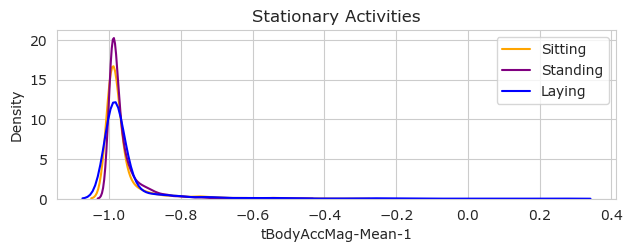

In [21]:
#creating a figure size for plot
plt.figure(figsize=(18,9))
#creating a subplot with 4 rows and 3 colums and assigning the selecting the first subplot in the grid using the number 1
plt.subplot(4,3,1)
#adding title
plt.title('Stationary Activities')
#creating a seaborn distribution plot for each dataframe for each label and setting histogram to false. 
#the color attribute differentiates each label
sns.distplot(df4['tBodyAccMag-Mean-1'],color = 'orange',hist = False, label = 'Sitting')
sns.distplot(df5['tBodyAccMag-Mean-1'],color = 'purple',hist = False,label = 'Standing')
sns.distplot(df6['tBodyAccMag-Mean-1'],color = 'blue',hist = False, label = 'Laying')
#set position of legend
plt.legend(loc='upper right')
#automatically adjusting subplot spacing to prevent overlaps
plt.tight_layout()
#display plot
plt.show()

### tBodyAccMag-Mean-1 for moving activities seem different from stationary activities. The data does not show a smooth curve because of a lot variations in acceleration when it comes to walking. walking downstairs seems to show wider variations

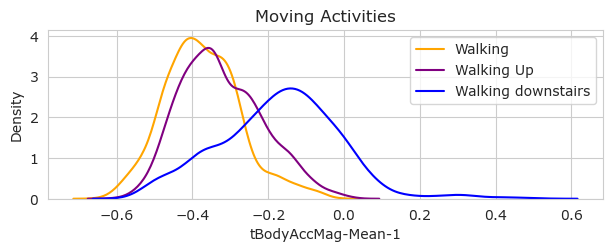

In [22]:
#creating a figure size for plot
plt.figure(figsize=(18,9))
#creating a subplot with 4 rows and 3 colums and assigning the selecting the first subplot in the grid using the number 2
plt.subplot(4,3,2)
#adding title
plt.title('Moving Activities')
#creating a seaborn distribution plot for each dataframe for each label and setting histogram to false. 
#the color attribute differentiates each label
sns.distplot(df1['tBodyAccMag-Mean-1'],color = 'orange',hist = False, label = 'Walking')
sns.distplot(df2['tBodyAccMag-Mean-1'],color = 'purple',hist = False,label = 'Walking Up')
sns.distplot(df3['tBodyAccMag-Mean-1'],color = 'blue',hist = False, label = 'Walking downstairs')
#set position of legend
plt.legend(loc='upper right')
#automatically adjusting subplot spacing to prevent overlaps
plt.tight_layout()
#view plot
plt.show()

### Visualising the mean body acceleration for transitional activities. In this plot sit to stand shows a higher concentration in the center area compared to the other activities. the other two activities look like they have similiar characteristics. although, sit to lie looks a bit skewed to the right and stand to sit is a bit skewed to the left

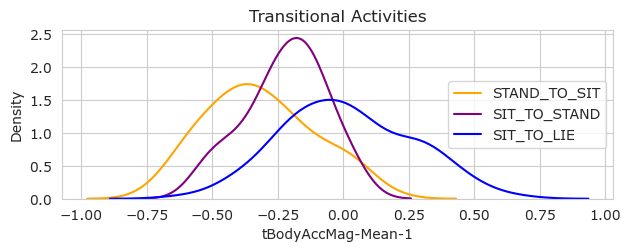

In [23]:
#creating a figure size for plot
plt.figure(figsize=(18,9))
#creating a subplot with 4 rows and 3 colums and assigning the selecting the first subplot in the grid using the number 3
plt.subplot(4,3,3)
#adding title
plt.title('Transitional Activities')
#creating a seaborn distribution plot for each dataframe for each label and setting histogram to false. 
#the color attribute differentiates each label
sns.distplot(df7['tBodyAccMag-Mean-1'],color = 'orange',hist = False, label = 'STAND_TO_SIT')
sns.distplot(df8['tBodyAccMag-Mean-1'],color = 'purple',hist = False,label = 'SIT_TO_STAND')
sns.distplot(df9['tBodyAccMag-Mean-1'],color = 'blue',hist = False, label = 'SIT_TO_LIE')
#set position of legend
plt.legend(loc='center right')
#automatically adjusting subplot spacing to prevent overlaps
plt.tight_layout()
#view plot
plt.show()

### Visualising the mean body acceleration for transitional activities. lie to sit and lie to stand have similiar patterns and they both seem concentrated at the top with. lie to sit seems to have a smoother curve compared to the rest.

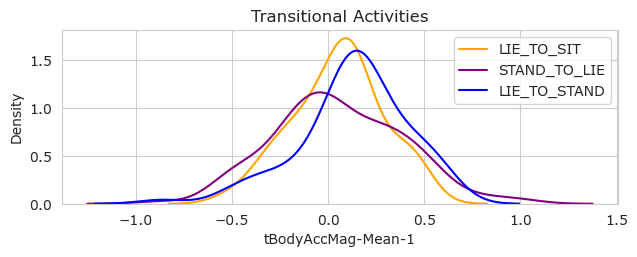

In [24]:
plt.figure(figsize=(18,9))
#creating a subplot with 4 rows and 3 colums and assigning the selecting the first subplot in the grid using the number 4
plt.subplot(4,3,4)
#adding title
plt.title('Transitional Activities')
#creating a seaborn distribution plot for each dataframe for each label and setting histogram to false. 
#the color attribute differentiates each label
sns.distplot(df10['tBodyAccMag-Mean-1'],color = 'orange',hist = False, label = 'LIE_TO_SIT')
sns.distplot(df11['tBodyAccMag-Mean-1'],color = 'purple',hist = False,label = 'STAND_TO_LIE')
sns.distplot(df12['tBodyAccMag-Mean-1'],color = 'blue',hist = False, label = 'LIE_TO_STAND')
#set position of legend
plt.legend(loc='upper right')
#automatically adjusting subplot spacing to prevent overlaps
plt.tight_layout()
#view plot
plt.show()

### plotting frequency of each body activity using time series chart. time series is best at capturing time related activities. Its basically a line chart plotted with respect to time. here we can see strong frequency in moving activities and very low frequency in stationary activities. there is a substancial amount of frequency in the transitional activities

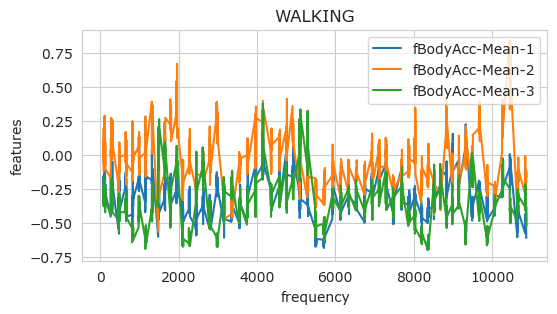

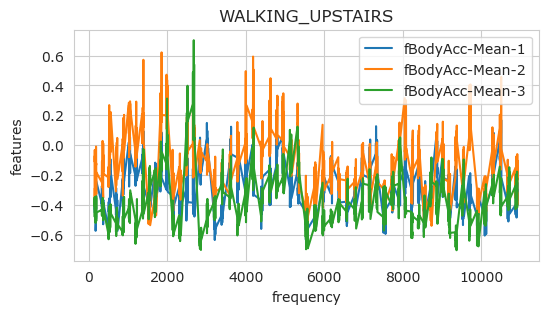

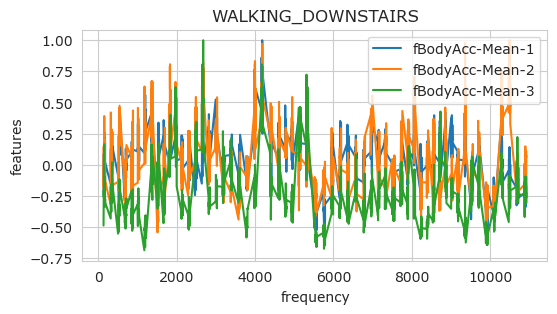

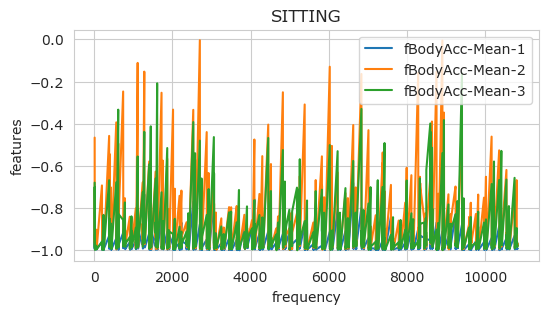

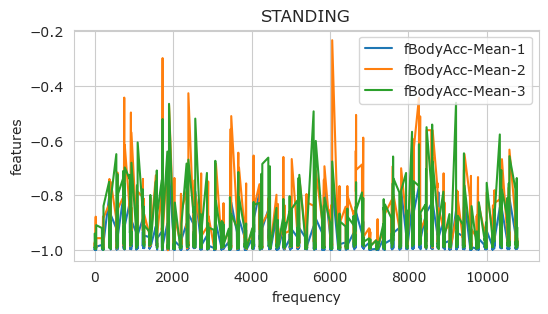

...

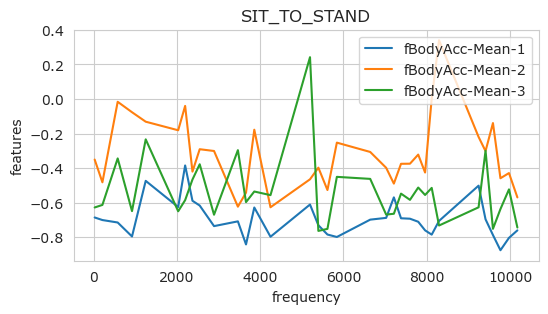

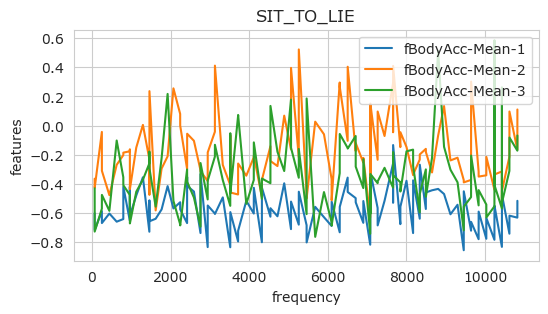

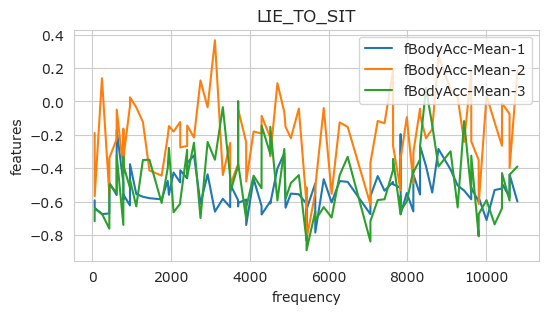

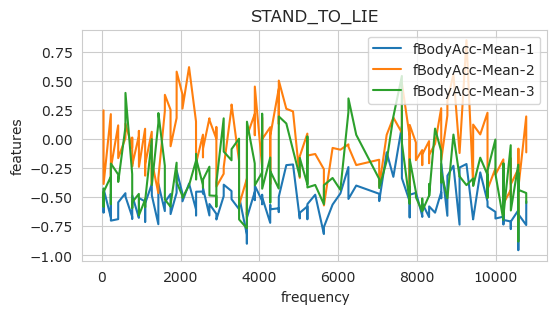

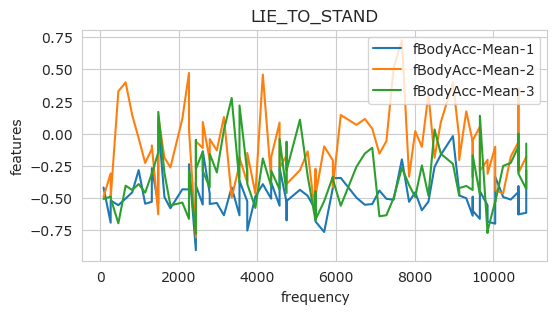

In [25]:
#plotting the fbodyacc-mean for each activity

#assigning features to the variable attributes
attributes = ['fBodyAcc-Mean-1', 'fBodyAcc-Mean-2', 'fBodyAcc-Mean-3']

#returning unique values of each activity and assigning to counts and the activity to activity_type
activity_type, counts = np.unique(activity_data.activity_name.values, return_counts=True)

# iterate over each activity
for activity_number in range(1, len(counts)+1):
    # subset data for the current activity
    activity_plot = merged_data[merged_data['label'] == activity_number]
    activity_status = activity_plot['activity'].iloc[0]
    
    # create a new plot for the current activity
    plt.figure(figsize=(6, 3))
    plt.title(activity_status)
    
    # plot the current activity's features
    for attribute in attributes:
        plt.plot(activity_plot[attribute], label=attribute)
        
    # add labels and legend
    plt.xlabel('frequency')
    plt.ylabel('features')
    plt.legend(loc='upper right')
    
    # show the plot for the current activity
    plt.show()



### The box plot allows for visual comparison of the tBodyAccMag-Mean-1 distribution across different activities and can reveal differences or similarities in the distribution between activities. the box plot is highly effective in showing the spread of data points across datasets and that was why it was used here. the horizontal lines shows threshhold values that predict how this features are spread across the dataset. the values below the green line indicates activities with less movements. the 

### Dropping columns from the merged dataset and merging labels

In [29]:
# Drop the "subject_ID", "label" and activity" columns from "merged_data" so that we have only floating point values
dropped_merged_data = merged_data.drop(['subject_ID', 'label','activity'], axis=1)
dropped_merged_data.shape

(10929, 561)

In [30]:
#combining both training and testing labels and assigning to the variable merged_labels
merged_labels = pd.concat([training_labels, testing_labels], axis=0)
merged_labels.shape

(10929, 2)

### plotting a scatter plot using 2D Principal component analysis. PCA is used for dimension reduction. from the data there is a lot of overlap between sitting standing and laying. there is also an overlap in the moving activities- walking, walking up stairs and walking downstairs

In [34]:
# Separate features (X) and activity labels (y)
X = dropped_merged_data
y = merged_labels['activity'].values

# Standardize the data
#scaler = StandardScaler()
#X_scaled = scaler.fit_transform(X)

# Perform PCA to reduce dimensions to 2
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)

# Create a dataframe with the reduced features and activity labels
df_reduced = pd.DataFrame({'PC1': X_reduced[:,0], 'PC2': X_reduced[:,1], 'activity': y})

#Create a dictionary with colorblind-friendly colors for each activity
color_dict = {'Walking': '#1f77b4', 'Walking Upstairs': '#ff7f0e', 'Walking Downstairs': '#2ca02c',
              'Sitting': '#d62728', 'Standing': '#9467bd', 'Laying': '#8c564b',
              'Stand_to_Sit': '#e377c2', 'Sit_to_Stand': '#7f7f7f', 'Sit_to_Lie': '#bcbd22',
              'Lie_to_Sit': '#17becf', 'Stand_to_Lie': '#2f4b7c','Lie_to_Stand': '#d6616b'}

#Use Plotly to create an interactive scatterplot with separate colors for each activity
fig_2d = px.scatter(df_reduced, x='PC1', y='PC2', color='activity', color_discrete_map=color_dict, title='HAPT Dataset Activities (2D PCA)')
fig_2d.update_layout(
    title={
        'text': 'HAPT Dataset Activities (2D PCA)',
        'font': {'size': 25, 'family': 'Arial', 'color': 'black'}
    }
)

fig_2d.show()

### plot showing the features correlation using a T-SNE. T-SNE is a very strong technique that uses a non linear approach to minimize dimensions. it looks similiar to the PCA results, however the overlapping is mostly on sitting and standing

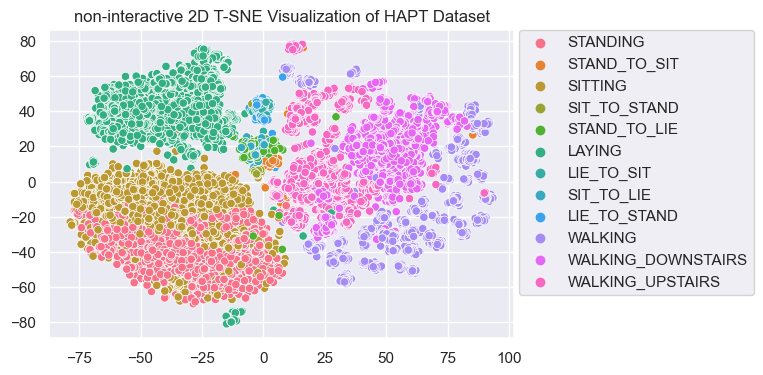

In [35]:
# Separate features and labels
X = dropped_merged_data
y = merged_labels['activity']

# Standardize the data
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# Apply T-SNE for dimensionality reduction
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_std)

# Plot the results
plt.figure(figsize=(6, 4))
sns.scatterplot(x=X_tsne[:,0], y=X_tsne[:,1], hue=y, palette=sns.color_palette("husl", len(y.unique())))
plt.title('non-interactive 2D T-SNE Visualization of HAPT Dataset')
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
plt.show()

### Interactive 3d PCA plot showing variable correlation. this interactive PCA shows a lot of clutter within the dataset

In [36]:
# Map labels to activity names
activity_map = {1: 'Walking', 2: 'Walking Upstairs', 3: 'Walking Downstairs', 4: 'Sitting', 5: 'Standing', 6: 'Laying',
               7: 'Stand_to_Sit', 8: 'Sit_to_Stand', 9: 'Sit_to_Lie', 10: 'Lie_to_Sit', 11: 'Stand_to_Lie', 12: 'Lie_to_Stand'}
merged_labels['activity'] = merged_labels['label'].map(activity_map)

# Separate features and labels
X = dropped_merged_data
y = merged_labels['activity']

# Standardize the data
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# Apply PCA for dimensionality reduction
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_std)

# Create a DataFrame with the reduced data and corresponding activity labels
df = pd.DataFrame({'PCA 1': X_pca[:, 0], 'PCA 2': X_pca[:, 1], 'PCA 3': X_pca[:, 2], 'activity': y})

# Define a color map for the activities
activity_color_map = {'Walking': 'rgb(0, 128, 0)', 'Walking Upstairs': 'rgb(0, 0, 255)', 'Walking Downstairs': 'rgb(255, 0, 0)',
                      'Sitting': 'rgb(255, 255, 0)', 'Standing': 'rgb(255, 165, 0)', 'Laying': 'rgb(128, 0, 128)',
                      'Stand_to_Sit': 'rgb(100, 149, 237)', 'Sit_to_Stand': 'rgb(218, 112, 214)', 'Sit_to_Lie': 'rgb(0, 0, 128)',
                      'Lie_to_Sit': 'rgb(255, 0, 255)', 'Stand_to_Lie': 'rgb(32, 178, 170)', 'Lie_to_Stand': 'rgb(128, 0, 0)'}

# Create the plot
fig = px.scatter_3d(df, x='PCA 1', y='PCA 2', z='PCA 3', color='activity', color_discrete_map=activity_color_map,
                    title='3D PCA Plot of HAPT Dataset with Unique Colors for Each Activity', width=800, height=800)
#updating title layout
fig_2d.update_layout(
    title={
        'text': '3D PCA Plot of HAPT Dataset with Unique Colors for Each Activity',
        'font': {'size': 25, 'family': 'Arial', 'color': 'black'}
    }
)
# Show the plot
fig.show()

### Interactive 2d T-SNE plot showing variable correlation. there is an overlapping between standing and sitting activities. it means that they are projected into the same region of the lower-dimensional space, which suggests that they have similar feature representations. the moving activities are not overlapping but they are within proximity and they are scattered about showing variance in data.

In [37]:
# Separate features and labels
X = dropped_merged_data
y = merged_labels['activity'].values

# Standardize the data
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

# Apply T-SNE for dimensionality reduction
tsne = TSNE(n_components=2, perplexity=30, random_state=42)
X_tsne = tsne.fit_transform(X_std)

# Add the activity labels to the X_tsne dataframe
X_tsne_df = pd.DataFrame(X_tsne, columns=['x', 'y'])
X_tsne_df['activity'] = y

# Define the color scheme for each activity label
color_scale = px.colors.qualitative.Set1[:len(X_tsne_df['activity'].unique())]

# Create an interactive 2D scatter plot using Plotly
fig = px.scatter(X_tsne_df, x='x', y='y', color='activity', color_discrete_sequence=color_scale, opacity=0.8)

# Set the title and axis labels
fig.update_layout(title='T-SNE Visualization of HAPT Dataset', xaxis_title='TSNE 1', yaxis_title='TSNE 2')

#updating title
fig_2d.update_layout(
    title={
        'text': '3D PCA Plot of HAPT Dataset with Unique Colors for Each Activity',
        'font': {'size': 25, 'family': 'Arial', 'color': 'black'}
    }
)
# Show the plot
fig.show()


### Interactive 2d U-MAP plot showing variable correlation. this map uses a manifold approach to dimension reduction. there is a clearer representation of variables. we can see the overlap between sitting and standing. overlapping of some parts of moving activities and laying down is well separarted from other stationary activities

In [39]:
#mapping the activities to labels
activity_map = {1: 'Walking', 2: 'Walking Upstairs', 3: 'Walking Downstairs', 4: 'Sitting', 5: 'Standing', 6: 'Laying',
               7: 'Stand_to_Sit', 8: 'Sit_to_Stand', 9: 'Sit_to_Lie', 10: 'Lie_to_Sit', 11: 'Stand_to_Lie', 12: 'Lie_to_Stand'}
merged_labels['activity'] = merged_labels['label'].map(activity_map)

# Standardize the data
scaler = StandardScaler()
merged_data_scaled = scaler.fit_transform(dropped_merged_data)

# Apply UMAP for dimensionality reduction
umap = UMAP(n_components=2, random_state=42)
umap_data = umap.fit_transform(merged_data_scaled)

# Create a DataFrame with the reduced data and corresponding activity labels
df = pd.DataFrame({'UMAP 1': umap_data[:, 0], 'UMAP 2': umap_data[:, 1], 'activity': merged_labels['activity']})

# Define a color map for the activities
activity_color_map = {'Walking': 'rgb(0, 128, 0)', 'Walking Upstairs': 'rgb(0, 0, 255)', 'Walking Downstairs': 'rgb(255, 0, 0)',
                      'Sitting': 'rgb(255, 255, 0)', 'Standing': 'rgb(255, 165, 0)', 'Laying': 'rgb(128, 0, 128)',
                      'Stand_to_Sit': 'rgb(100, 149, 237)', 'Sit_to_Stand': 'rgb(218, 112, 214)', 'Sit_to_Lie': 'rgb(0, 0, 128)',
                      'Lie_to_Sit': 'rgb(255, 0, 255)', 'Stand_to_Lie': 'rgb(32, 178, 170)', 'Lie_to_Stand': 'rgb(128, 0, 0)'}

# Create the plot
fig = px.scatter(df, x='UMAP 1', y='UMAP 2', color='activity', color_discrete_map=activity_color_map,
                 title='Interactive UMAP Plot of HAPT Dataset with Unique Colors for Activities')

# Show the plot
fig.show()

### Training a Random forest classifier on the HAPT dataset and visualising predictions using PCA, TSNE and UMAP

In [42]:
# Train Random Forest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(training_data, training_labels['label'])

# Make predictions on test data
y_pred = clf.predict(testing_data)

In [43]:
# Compute accuracy score
accuracy = accuracy_score(testing_labels['label'], y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.9114484503478811


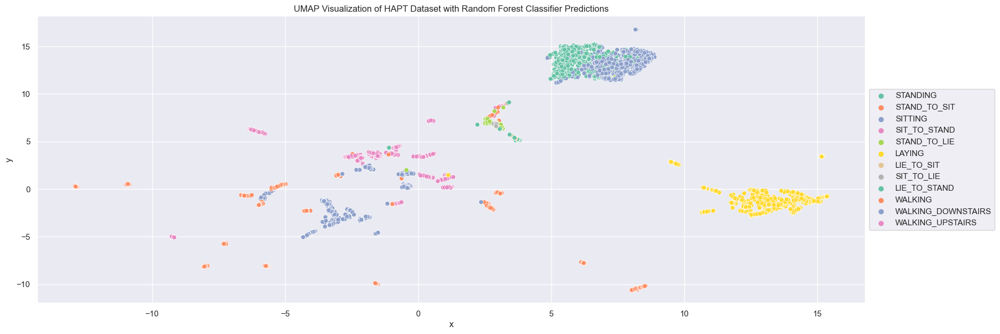

In [44]:
#list of activities
activity_obj = ["WALKING", "WALKING_UPSTAIRS", "WALKING_DOWNSTAIRS", "SITTING", "STANDING", 
                   "LAYING", "STAND_TO_SIT", "SIT_TO_STAND", "SIT_TO_LIE", "LIE_TO_SIT", "STAND_TO_LIE", "LIE_TO_STAND"]

# looping to Convert the predicted activity numbers to labels
y_pred_labels = [activity_obj[i-1] for i in y_pred]

# Visualize predictions using UMAP
umap_embeddings = UMAP(n_neighbors=10, min_dist=0.1, metric='euclidean').fit_transform(testing_data)
umap_df = pd.DataFrame({'x': umap_embeddings[:, 0], 'y': umap_embeddings[:, 1], 'label': testing_labels['activity'],
                       'pred_label': y_pred_labels})
sns.scatterplot(data=umap_df, x='x', y='y', hue='label', palette='Set2')
plt.title("UMAP Visualization of HAPT Dataset with Random Forest Classifier Predictions")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

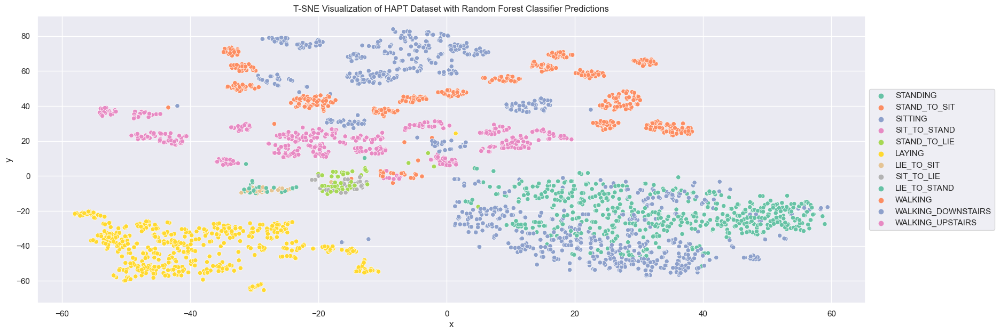

In [45]:
#list of activities
activity_obj = ["WALKING", "WALKING_UPSTAIRS", "WALKING_DOWNSTAIRS", "SITTING", "STANDING", 
                   "LAYING", "STAND_TO_SIT", "SIT_TO_STAND", "SIT_TO_LIE", "LIE_TO_SIT", "STAND_TO_LIE", "LIE_TO_STAND"]

# looping to Convert the predicted activity numbers to labels
y_pred_labels = [activity_obj[i-1] for i in y_pred]

# Visualize predictions using t-SNE
tsne_embeddings = TSNE(n_components=2, perplexity=30, learning_rate=200).fit_transform(testing_data)
tsne_df = pd.DataFrame({'x': tsne_embeddings[:, 0], 'y': tsne_embeddings[:, 1], 'label': testing_labels['activity'],
                        'pred_label': y_pred_labels})
sns.scatterplot(data=tsne_df, x='x', y='y', hue='label', palette='Set2')
plt.title("T-SNE Visualization of HAPT Dataset with Random Forest Classifier Predictions")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

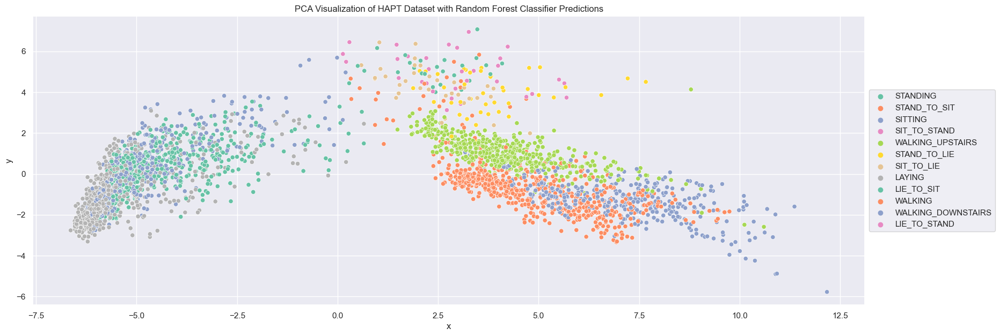

In [46]:
#list of activities
activity_obj = ["WALKING", "WALKING_UPSTAIRS", "WALKING_DOWNSTAIRS", "SITTING", "STANDING", 
                   "LAYING", "STAND_TO_SIT", "SIT_TO_STAND", "SIT_TO_LIE", "LIE_TO_SIT", "STAND_TO_LIE", "LIE_TO_STAND"]

# looping to Convert the predicted activity numbers to labels
y_pred_labels = [activity_obj[i-1] for i in y_pred]

# Visualize predictions using PCA
pca_embeddings = PCA(n_components=2).fit_transform(testing_data)

# Create a DataFrame with the PCA embeddings, activity labels, and predicted activity labels
pca_df = pd.DataFrame({'x': pca_embeddings[:, 0], 'y': pca_embeddings[:, 1], 'label': testing_labels['activity'],
                       'pred_label': y_pred_labels})

# Plot the PCA visualization with predicted activity labels
sns.scatterplot(data=pca_df, x='x', y='y', hue='pred_label', palette='Set2')
plt.title("PCA Visualization of HAPT Dataset with Random Forest Classifier Predictions")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))  # Show the legend outside the plot area
plt.show()
